This is how to explore data.  
The code is partically taken from the official API  
https://github.com/ranjaykrishna/visual_genome_python_driver/  
https://visualgenome.org/api/v0/api_beginners_tutorial.html

In [2]:
import json

import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
#from src import api as vg
from PIL import Image as PIL_Image
import requests
from StringIO import StringIO

import matplotlib
%matplotlib inline

import random

import unicodecsv as csv
from tqdm import tqdm

# images_data

In [3]:
#we do not have to use image_data.json in this project.
#this is jsut a meta data for images (e.g. images source)

with open('./data/image_data.json', 'r') as f:
    image_data = json.load(f)
    
{u'coco_id': None,
  u'flickr_id': None,
  u'height': 600,
  u'id': 1,
  u'url': u'https://cs.stanford.edu/people/rak248/VG_100K_2/1.jpg',
  u'width': 800}

{u'coco_id': None,
 u'flickr_id': None,
 u'height': 600,
 u'id': 1,
 u'url': u'https://cs.stanford.edu/people/rak248/VG_100K_2/1.jpg',
 u'width': 800}

# objects
  
we don't have to laod objects.json no?

In [4]:
with open('./data/objects.json', 'r') as f:
    all_objects = json.load(f)

In [5]:
i=0
image_id=all_objects[i][u'id']
image_objects=all_objects[i][u'objects']
j=1
image_object=image_objects[j]
object_x=image_object[u'x']
object_y=image_object[u'y']
object_w=image_object[u'w']
object_h=image_object[u'h']

In [7]:
image_objects[0].keys()

[u'h', u'names', u'w', u'y', u'x', u'id']

In [8]:
len(all_objects)

108077

In [6]:
def get_image_objects(image_id,all_objects):
    for i in xrange(len(all_objects)):
        image_id_=all_objects[i][u'id']
        if image_id==image_id_:
            objects=all_objects[i][u'objects']
    return objects

def plot_image_objects(image_id,all_objects):
    image_objects=get_image_objects(image_id,all_objects)
    
    fig = plt.gcf()
    fig.set_size_inches(18.5, 10.5)
    img = PIL_Image.open("./data/images/%d.jpg"%image_id)
    plt.imshow(img)
    for image_object in image_objects:
        ax = plt.gca()
        object_x=image_object[u'x']
        object_y=image_object[u'y']
        object_w=image_object[u'w']
        object_h=image_object[u'h']
        object_names=str(image_object[u'names'])
        x=object_x;y=object_y;width=object_w;height=object_h;phrase=object_names
        ax.add_patch(Rectangle((x, y),width,height,fill=False,edgecolor='red',linewidth=3))
        ax.text(x, y, phrase, style='italic', bbox={'facecolor':'white', 'alpha':0.7, 'pad':10})
    
    fig = plt.gcf()
    plt.tick_params(labelbottom='off', labelleft='off')
    plt.show()
    

In [10]:
#check how many have objects
count=0
for i in xrange(len(all_objects)):
    image_id_=all_objects[i][u'id']
    objects=all_objects[i][u'objects']
    if len(objects) > 0:
        count+=1
print count

64921


# relationships

In [7]:
with open('./data/relationships-half.json', 'r') as f:
    all_relationships = json.load(f)

In [8]:
#check how many have relashionships
count=0
for i in xrange(len(all_relationships)):
    image_id_=all_relationships[i][u'id']
    relationships=all_relationships[i][u'relationships']
    if len(relationships) > 0:
        count+=1
print count

50728


In [9]:
#make dataset for relationships

##don't rerun this part!!! this is to make dataset

# relationship_image_ids=[]
# for i in xrange(len(all_relationships)):
#     image_id_=all_relationships[i][u'id']
#     relationships=all_relationships[i][u'relationships']
#     if len(relationships) > 0:
#         relationship_image_ids.append(image_id_)
# print len(relationship_image_ids)

# random.shuffle(relationship_image_ids)

# relationship_test_image_ids=relationship_image_ids[0:4000]
# relationship_val_image_ids=relationship_image_ids[4000:8000]
# relationship_train_image_ids=relationship_image_ids[8000:50728]


# with open('./work/relationship_train_image_ids.csv', 'w') as f:
#     csvWriter = csv.writer(f)
#     csvWriter.writerow(relationship_train_image_ids)
    
# with open('./work/relationship_val_image_ids.csv', 'w') as f:
#     csvWriter = csv.writer(f)
#     csvWriter.writerow(relationship_val_image_ids)

# with open('./work/relationship_test_image_ids.csv', 'w') as f:
#     csvWriter = csv.writer(f)
#     csvWriter.writerow(relationship_test_image_ids)

with open('./work/relationship_train_image_ids.csv', 'r') as f:
    reader = csv.reader(f)
    relationship_train_image_ids=reader.next()
    relationship_train_image_ids = map(int,relationship_train_image_ids)
    
with open('./work/relationship_val_image_ids.csv', 'r') as f:
    reader = csv.reader(f)
    relationship_val_image_ids=reader.next()
    relationship_val_image_ids = map(int,relationship_val_image_ids)

with open('./work/relationship_test_image_ids.csv', 'r') as f:
    reader = csv.reader(f)
    relationship_test_image_ids=reader.next()
    relationship_test_image_ids = map(int,relationship_test_image_ids)

In [10]:
len(relationship_train_image_ids)

42728

In [11]:
def get_image_relationships(image_id,all_relationships):
    for i in xrange(len(all_relationships)):
        image_id_=all_relationships[i][u'id']
        if image_id==image_id_:
            relationships=all_relationships[i][u'relationships']
    return relationships

def get_image_relation_triples(image_id,all_relationships):
    for i in xrange(len(all_relationships)):
        image_id_=all_relationships[i][u'id']
        if image_id==image_id_:
            relationships=all_relationships[i][u'relationships']
    image_relationship_triples={}
    for triple in relationships:
        triple_id=triple[u'id']
        triple_predicate=triple[u'predicate']
        triple_subject_name=triple[u'subject']['name']
        triple_object_name=triple[u'object']['name']
        image_relationship_triples[triple_id]=[triple_subject_name,triple_predicate,triple_object_name]
    return image_relationship_triples

def plot_a_triple(image_id,triple):
    fig = plt.gcf()
    fig.set_size_inches(18.5, 10.5)
    img = PIL_Image.open("./data/images/%d.jpg"%image_id)
    plt.imshow(img)

    ax = plt.gca()
    id=triple[u'id']
    predicate=triple[u'predicate']

    subject=triple[u'subject']
    subject_name=subject['name']
    subject_x=subject['x']
    subject_y=subject['y']
    subject_w=subject['w']
    subject_h=subject['h']
    x=subject_x;y=subject_y;width=subject_w;height=subject_h;phrase=subject_name
    ax.add_patch(Rectangle((x, y),width,height,fill=False,edgecolor='red',linewidth=3))
    ax.text(x, y, phrase+" ->"+predicate, style='italic', bbox={'facecolor':'white', 'alpha':0.7, 'pad':10})

    object=triple[u'object']
    object_name=object['name']
    object_x=object['x']
    object_y=object['y']
    object_w=object['w']
    object_h=object['h']    
    x=object_x;y=object_y;width=object_w;height=object_h;phrase=object_name
    ax.add_patch(Rectangle((x, y),width,height,fill=False,edgecolor='blue',linewidth=3))
    ax.text(x, y, phrase, style='italic', bbox={'facecolor':'white', 'alpha':0.7, 'pad':10})

    fig = plt.gcf()
    plt.tick_params(labelbottom='off', labelleft='off')
    plt.show()

def plot_image_relationships(image_id,all_relationships):
    image_relationships=get_image_relationships(image_id,all_relationships)
    
    fig = plt.gcf()
    fig.set_size_inches(18.5, 10.5)
    img = PIL_Image.open("./data/images/%d.jpg"%image_id)
    plt.imshow(img)
    for triple in image_relationships:
        ax = plt.gca()
        triple_id=triple[u'id']
        triple_predicate=triple[u'predicate']

        triple_subject=triple[u'subject']
        triple_subject_name=triple_subject['name']
        triple_subject_x=triple_subject['x']
        triple_subject_y=triple_subject['y']
        triple_subject_w=triple_subject['w']
        triple_subject_h=triple_subject['h']
        x=triple_subject_x;y=triple_subject_y;width=triple_subject_w;height=triple_subject_h;phrase=triple_subject_name
        ax.add_patch(Rectangle((x, y),width,height,fill=False,edgecolor='red',linewidth=3))
        ax.text(x, y, phrase+" ->"+triple_predicate, style='italic', bbox={'facecolor':'white', 'alpha':0.7, 'pad':10})

        triple_object=triple[u'object']
        triple_object_name=triple_object['name']
        triple_object_x=triple_object['x']
        triple_object_y=triple_object['y']
        triple_object_w=triple_object['w']
        triple_object_h=triple_object['h']        
        x=triple_object_x;y=triple_object_y;width=triple_object_w;height=triple_object_h;phrase=triple_object_name
        ax.add_patch(Rectangle((x, y),width,height,fill=False,edgecolor='blue',linewidth=3))
        ax.text(x, y, phrase, style='italic', bbox={'facecolor':'white', 'alpha':0.7, 'pad':10})
        
       
    plt.tick_params(labelbottom='off', labelleft='off')
    plt.show()   

def plot_image_relationships_each(image_id,all_relationships):
    image_relationships=get_image_relationships(image_id,all_relationships)

    for triple in image_relationships:
        fig = plt.gcf()
        fig.set_size_inches(18.5, 10.5)
        img = PIL_Image.open("./data/images/%d.jpg"%image_id)
        plt.imshow(img)
        ax = plt.gca()
        triple_id=triple[u'id']
        triple_predicate=triple[u'predicate']

        triple_subject=triple[u'subject']
        triple_subject_name=triple_subject['name']
        triple_subject_x=triple_subject['x']
        triple_subject_y=triple_subject['y']
        triple_subject_w=triple_subject['w']
        triple_subject_h=triple_subject['h']
        x=triple_subject_x;y=triple_subject_y;width=triple_subject_w;height=triple_subject_h;phrase=triple_subject_name
        ax.add_patch(Rectangle((x, y),width,height,fill=False,edgecolor='red',linewidth=3))
        ax.text(x, y, phrase+" ->"+triple_predicate, style='italic', bbox={'facecolor':'white', 'alpha':0.7, 'pad':10})

        triple_object=triple[u'object']
        triple_object_name=triple_object['name']
        triple_object_x=triple_object['x']
        triple_object_y=triple_object['y']
        triple_object_w=triple_object['w']
        triple_object_h=triple_object['h']        
        x=triple_object_x;y=triple_object_y;width=triple_object_w;height=triple_object_h;phrase=triple_object_name
        ax.add_patch(Rectangle((x, y),width,height,fill=False,edgecolor='blue',linewidth=3))
        ax.text(x, y, phrase, style='italic', bbox={'facecolor':'white', 'alpha':0.7, 'pad':10})
        plt.tick_params(labelbottom='off', labelleft='off')
        plt.show()   

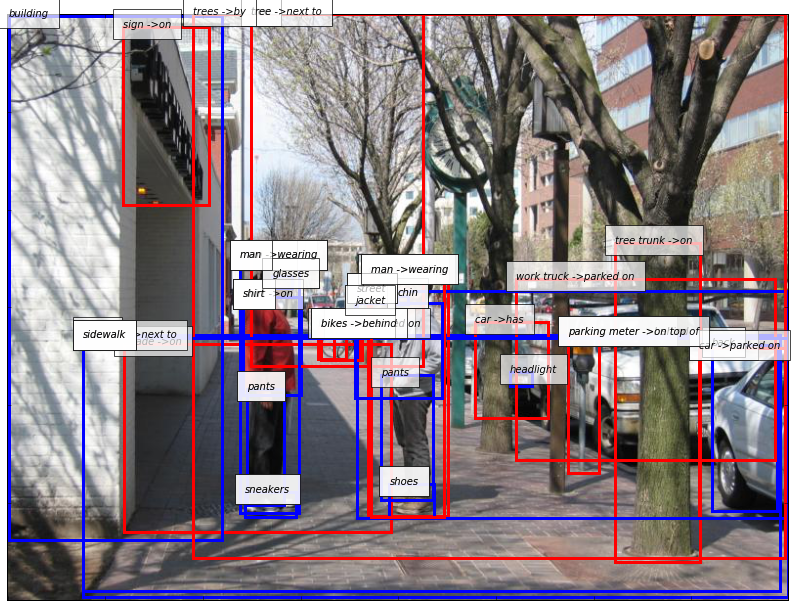

In [13]:
plot_image_relationships(1,all_relationships)

In [12]:
#plot_image_relationships_each(2326270,all_relationships)

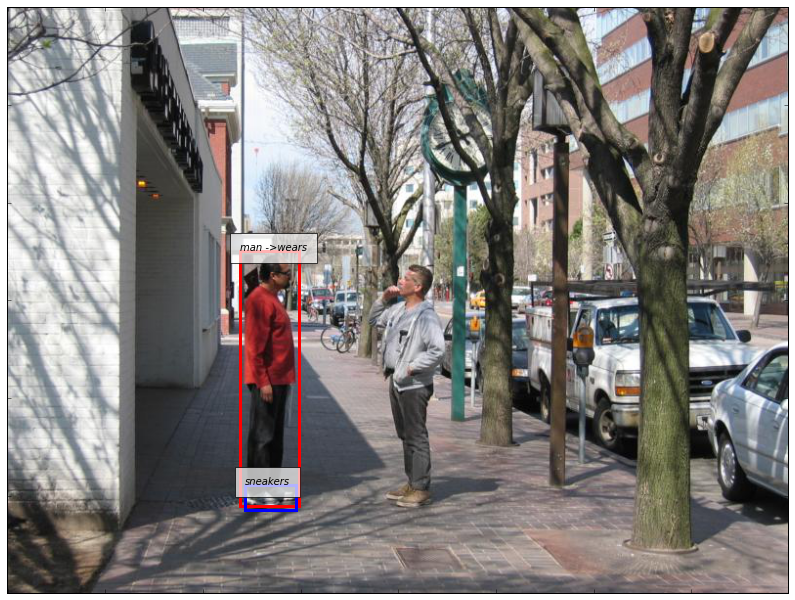

In [13]:
image_relationships=get_image_relationships(1,all_relationships)
plot_a_triple(1,image_relationships[1])

In [14]:
# image_relationship_triples=get_image_relation_triples(10,all_relationships)
# image_relationship_triples.values()

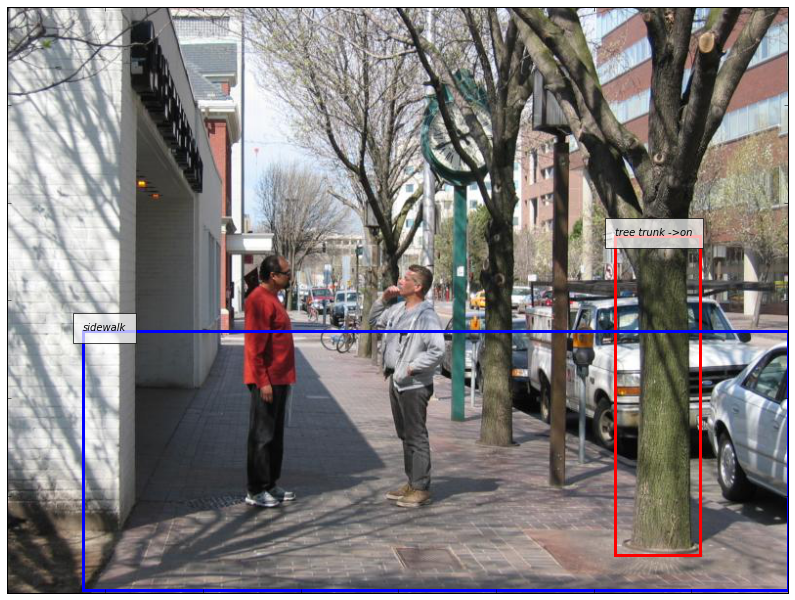

In [16]:
image_relationships=get_image_relationships(1,all_relationships)
plot_a_triple(1,image_relationships[4])

##attributes

In [15]:
with open('./data/attributes-half.json', 'r') as f:
    all_attributes = json.load(f)

In [16]:
#check how many images have attributes
count=0
for i in xrange(len(all_attributes)):
    image_id_=all_attributes[i][u'id']
    attributes=all_attributes[i][u'attributes']
    if len(attributes) > 0:
        count+=1
print count

52741


In [75]:
#make dataset for attribute

##don't rerun this!!! this is to make dataset

# attribute_image_ids=[]
# for i in xrange(len(all_attributes)):
#     image_id_=all_attributes[i][u'id']
#     attributes=all_attributes[i][u'attributes']
#     if len(attributes) > 0:
#         attribute_image_ids.append(image_id_)
# print len(attribute_image_ids)

# random.shuffle(attribute_image_ids)

# attribute_test_image_ids=attribute_image_ids[0:4000]
# attribute_val_image_ids=attribute_image_ids[4000:8000]
# attribute_train_image_ids=attribute_image_ids[8000:52741]


# with open('./work/attribute_train_image_ids.csv', 'w') as f:
#     csvWriter = csv.writer(f)
#     csvWriter.writerow(attribute_train_image_ids)
    
# with open('./work/attribute_val_image_ids.csv', 'w') as f:
#     csvWriter = csv.writer(f)
#     csvWriter.writerow(attribute_val_image_ids)

# with open('./work/attribute_test_image_ids.csv', 'w') as f:
#     csvWriter = csv.writer(f)
#     csvWriter.writerow(attribute_test_image_ids)

with open('./work/attribute_train_image_ids.csv', 'r') as f:
    reader = csv.reader(f)
    attribute_train_image_ids=reader.next()
    attribute_train_image_ids = map(int,attribute_train_image_ids)
    
with open('./work/attribute_val_image_ids.csv', 'r') as f:
    reader = csv.reader(f)
    attribute_val_image_ids=reader.next()
    attribute_val_image_ids = map(int,attribute_val_image_ids)

with open('./work/attribute_test_image_ids.csv', 'r') as f:
    reader = csv.reader(f)
    attribute_test_image_ids=reader.next()
    attribute_test_image_ids = map(int,attribute_test_image_ids)

In [30]:
#make dataset for attribute

##don't rerun this!!! this is to make dataset

attribute_image_ids=set()
for i in tqdm(xrange(len(all_attributes))):
    image_id_=all_attributes[i][u'id']
    image_attributes=all_attributes[i][u'attributes']
    for triple in image_attributes:
        triple_id=triple[u'id']
        triple_attritbues=triple[u'attributes']
        if len(triple_attritbues) > 0:
            attribute_image_ids.add(image_id_)
            
print len(attribute_image_ids)

attribute_image_ids=list(attribute_image_ids)
random.shuffle(attribute_image_ids)

attribute_test_image_ids=attribute_image_ids[0:4000]
attribute_val_image_ids=attribute_image_ids[4000:8000]
attribute_train_image_ids=attribute_image_ids[8000:46918]


# with open('./work/attribute_train_image_ids.csv', 'w') as f:
#     csvWriter = csv.writer(f)
#     csvWriter.writerow(attribute_train_image_ids)
    
# with open('./work/attribute_val_image_ids.csv', 'w') as f:
#     csvWriter = csv.writer(f)
#     csvWriter.writerow(attribute_val_image_ids)

# with open('./work/attribute_test_image_ids.csv', 'w') as f:
#     csvWriter = csv.writer(f)
#     csvWriter.writerow(attribute_test_image_ids)

with open('./work/attribute_train_image_ids.csv', 'r') as f:
    reader = csv.reader(f)
    attribute_train_image_ids=reader.next()
    attribute_train_image_ids = map(int,attribute_train_image_ids)
    
with open('./work/attribute_val_image_ids.csv', 'r') as f:
    reader = csv.reader(f)
    attribute_val_image_ids=reader.next()
    attribute_val_image_ids = map(int,attribute_val_image_ids)

with open('./work/attribute_test_image_ids.csv', 'r') as f:
    reader = csv.reader(f)
    attribute_test_image_ids=reader.next()
    attribute_test_image_ids = map(int,attribute_test_image_ids)

100%|██████████| 108077/108077 [00:00<00:00, 175627.04it/s]


46918


In [ ]:
# print len(all_objects[0][u'objects'])
# print len(all_attributes[0][u'attributes'])
#all_attributes[0][u'attributes']

In [ ]:
# count=0
# for i in xrange(len(all_attributes)):
#     image_id=all_attributes[i][u'id']
#     attributes=all_attributes[i][u'attributes']
#     flag=0
#     for line in attributes:
#         if len(line[u'object_names'])>2:
#             flag+=1
#     if flag>0:
#         print image_id,flag

In [18]:
def get_image_attributes(image_id,all_attributes):
    for i in xrange(len(all_attributes)):
        image_id_=all_objects[i][u'id']
        if image_id==image_id_:
            attributes=all_attributes[i][u'attributes']
    return attributes

def get_image_attribute_triples(image_id,all_attributes):
    for i in xrange(len(all_attributes)):
        image_id_=all_objects[i][u'id']
        if image_id==image_id_:
            attributes=all_attributes[i][u'attributes']
    image_attribute_triples=[]
    for triple in attributes:
        triple_id=triple[u'id']
        triple_predicate="is"
        triple_subject=str(triple[u'object_names'][0])#we ignore mulitple object namae...
        for attribute in triple[u'attributes']:
            image_attribute_triples.append([triple_subject,triple_predicate,attribute])        
    return image_attribute_triples

def plot_image_attributes(image_id,all_attributes):
    image_objects=get_image_attributes(image_id,all_attributes)
    
    fig = plt.gcf()
    fig.set_size_inches(18.5, 10.5)
    img = PIL_Image.open("./data/images/%d.jpg"%image_id)
    plt.imshow(img)
    for image_object in image_objects:
        ax = plt.gca()
        object_x=image_object[u'x']
        object_y=image_object[u'y']
        object_w=image_object[u'w']
        object_h=image_object[u'h']
        object_names=str(image_object[u'object_names'])
        object_attributes=str(image_object[u'attributes'])
        x=object_x;y=object_y;width=object_w;height=object_h;phrase=object_names+"is"+object_attributes
        ax.add_patch(Rectangle((x, y),width,height,fill=False,edgecolor='red',linewidth=3))
        ax.text(x, y, phrase, style='italic', bbox={'facecolor':'white', 'alpha':0.7, 'pad':10})
    
    fig = plt.gcf()
    plt.tick_params(labelbottom='off', labelleft='off')
    plt.show()


def plot_image_attributes_each(image_id,all_attributes,allow_no_attribute=False):
    image_objects=get_image_attributes(image_id,all_attributes)
    
    for image_object in image_objects:
        if len(image_object[u'attributes'])==0 and allow_no_attribute==False:
            continue
            
        fig = plt.gcf()
        fig.set_size_inches(18.5, 10.5)
        img = PIL_Image.open("./data/images/%d.jpg"%image_id)
        plt.imshow(img)
        ax = plt.gca()
        object_x=image_object[u'x']
        object_y=image_object[u'y']
        object_w=image_object[u'w']
        object_h=image_object[u'h']
        object_names=str(image_object[u'object_names'])
        object_attributes=str(image_object[u'attributes'])
        
        x=object_x;y=object_y;width=object_w;height=object_h;phrase=object_names+"is"+object_attributes
        ax.add_patch(Rectangle((x, y),width,height,fill=False,edgecolor='red',linewidth=3))
        ax.text(x, y, phrase, style='italic', bbox={'facecolor':'white', 'alpha':0.7, 'pad':10})

        fig = plt.gcf()
        plt.tick_params(labelbottom='off', labelleft='off')
        plt.show()
        
        

In [110]:
get_image_attribute_triples(10,all_attributes)

[['charger', 'is', u'black'],
 ['wall', 'is', u'green'],
 ['board', 'is', u'cork'],
 ['board', 'is', u'hanging'],
 ['bookshelf', 'is', u'wood'],
 ['bookshelf', 'is', u'leaning'],
 ['cup', 'is', u'blue'],
 ['papers', 'is', u'scattered'],
 ['picture frame', 'is', u'blank'],
 ['shelf', 'is', u'full'],
 ['floor', 'is', u'grey'],
 ['coat', 'is', u'blue'],
 ['coat', 'is', u'red'],
 ['ostrich', 'is', u'stuffed'],
 ['cup', 'is', u'blue'],
 ['computer screen', 'is', u'on'],
 ['shirt', 'is', u'grey'],
 ['monitor', 'is', u'on'],
 ['keyboard', 'is', u'white'],
 ['picture frame', 'is', u'blank']]

In [ ]:
for i in xrange(len(all_attributes)):
    image_id_=all_objects[i][u'id']

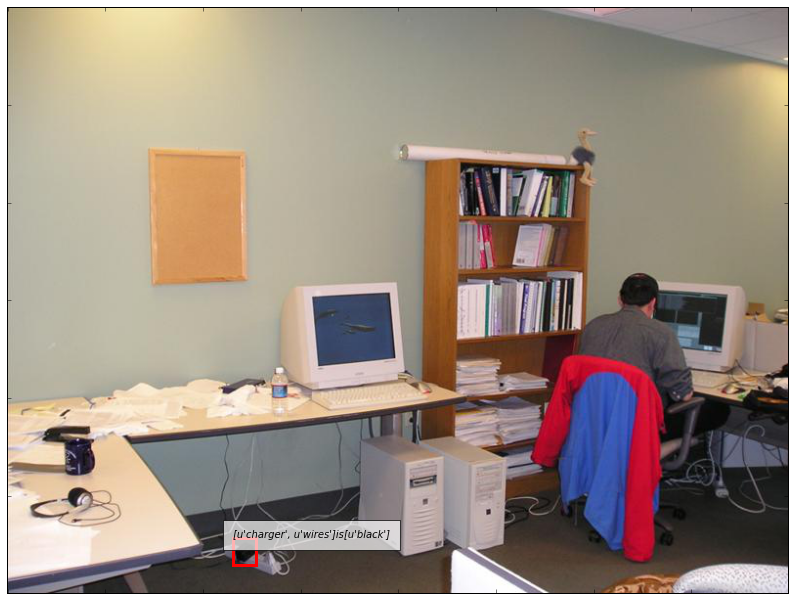

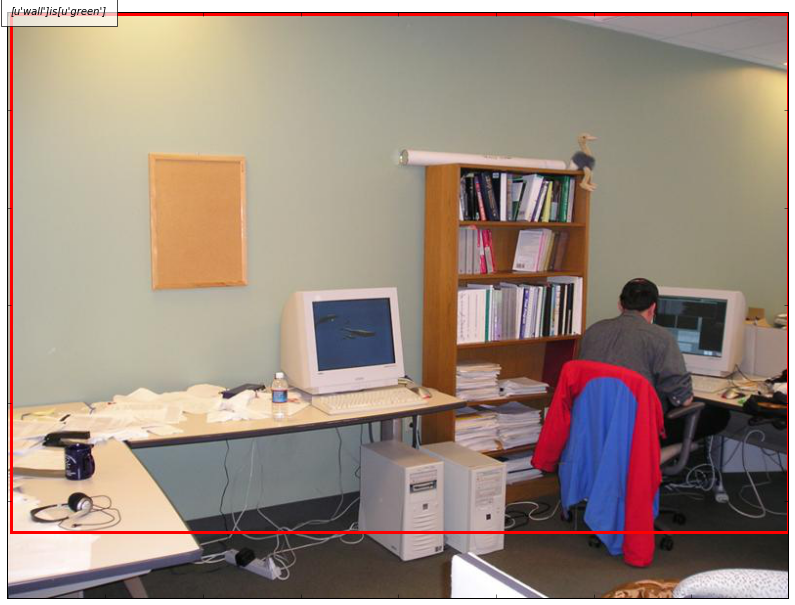

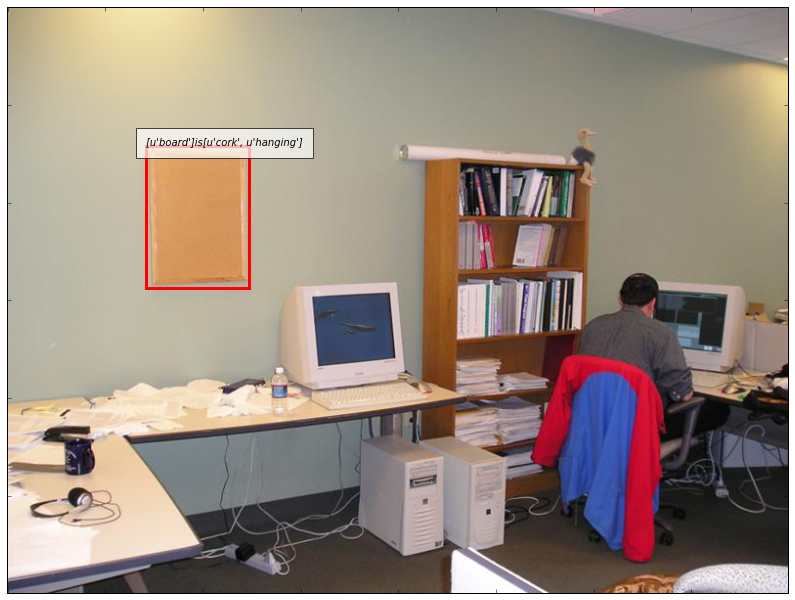

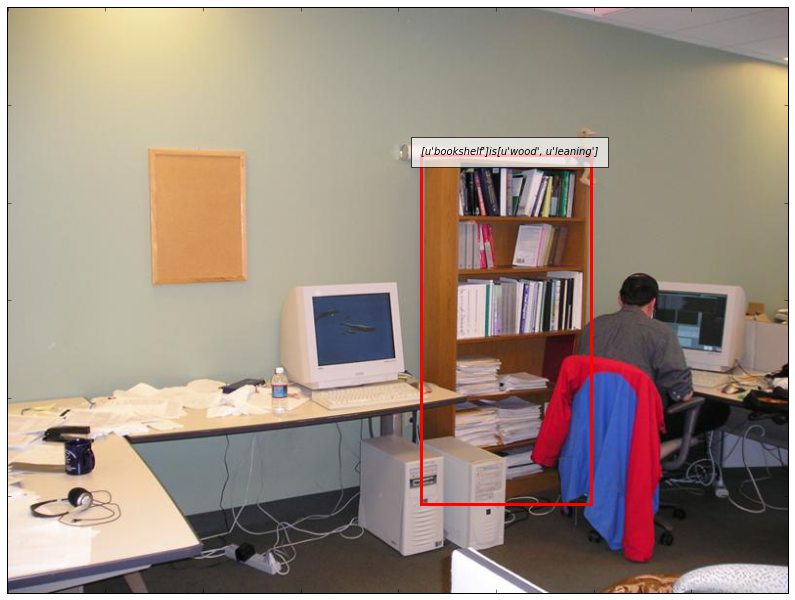

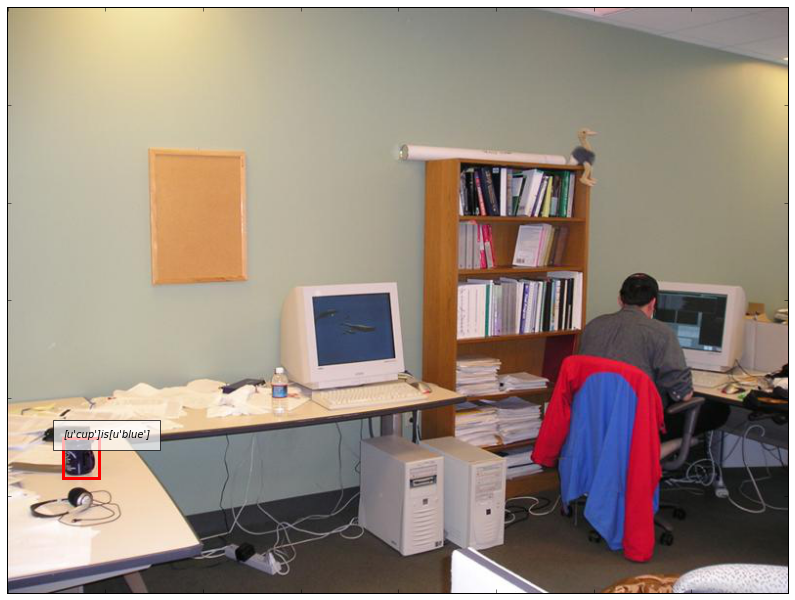

...

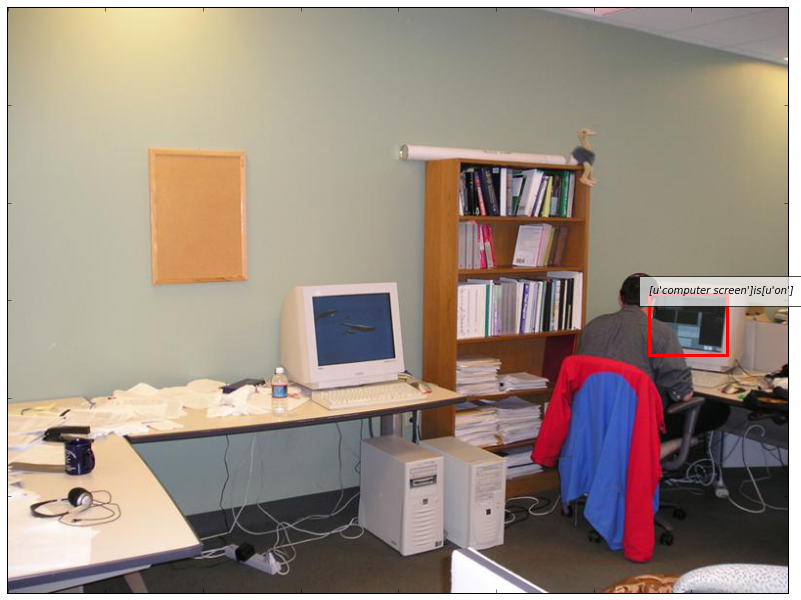

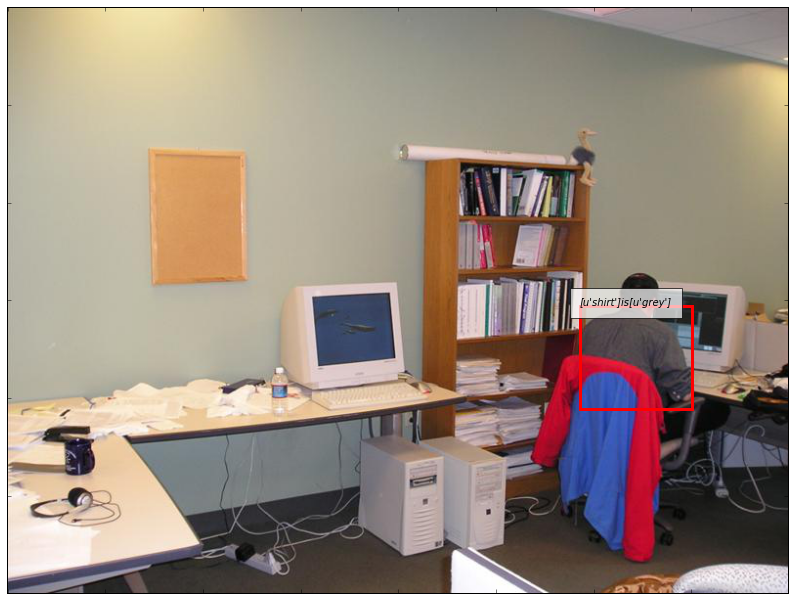

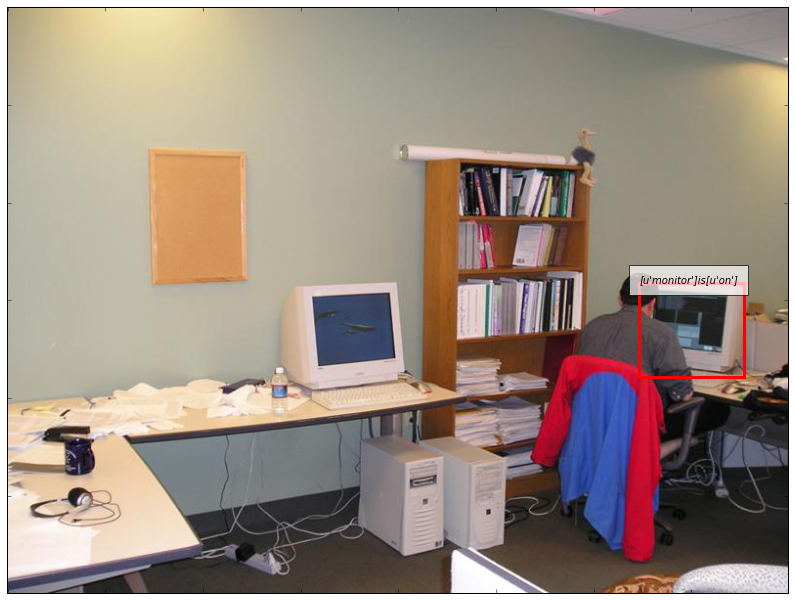

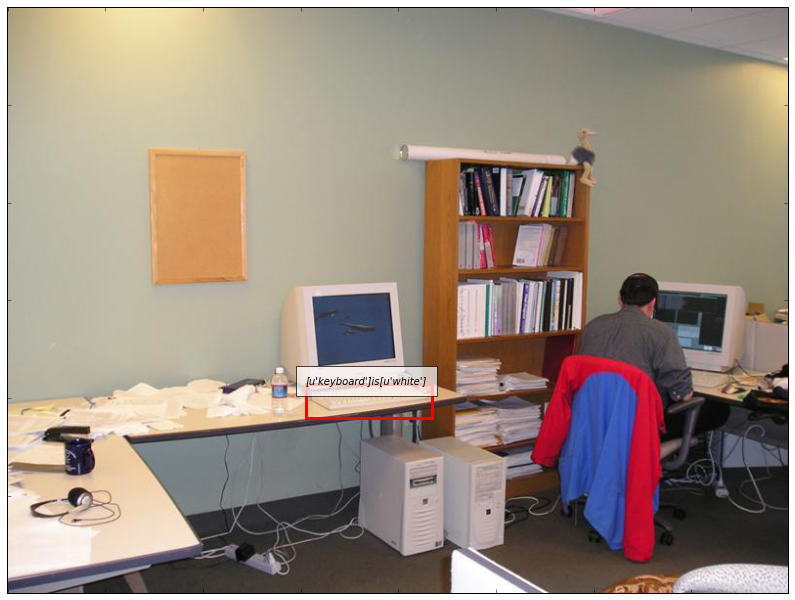

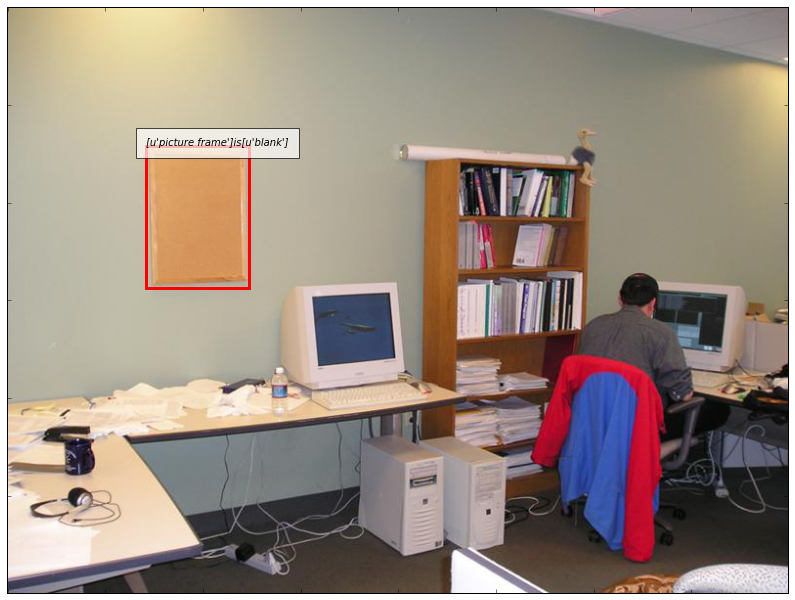

In [84]:
get_image_attributes(10,all_attributes)
plot_image_attributes_each(10,all_attributes)